# Dependências

In [88]:
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Imagens usadas

In [89]:
baboon = cv2.imread("baboon.png")

In [90]:
butterfly = cv2.imread("butterfly.png")

In [91]:
city = cv2.imread("city.png")

In [92]:
baboon_color = cv2.imread("baboon_color.png")

# 1.1 Mosaico
Para construirmos o mosaico, será usada a imagem do `baboon`.

Começamos dividindo a imagem em 16 partes de 128x128 e guardamos em uma lista. Após isso, montamos uma matriz que representa o formato do mosaico. Assim podemos usar essa lista pra juntarmos as partes de maneira horizontal e depois de maneira vertical.

É importante lembrar que a matriz `format` está com índices diferentes do enunciado, pois python tem indexação começando em 0.



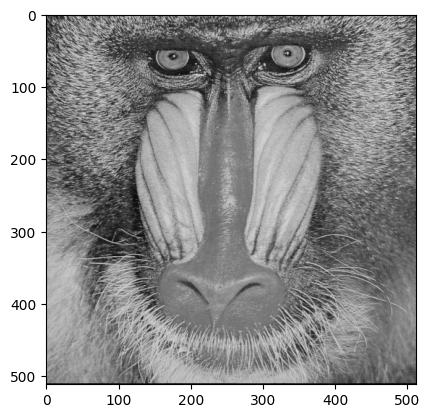

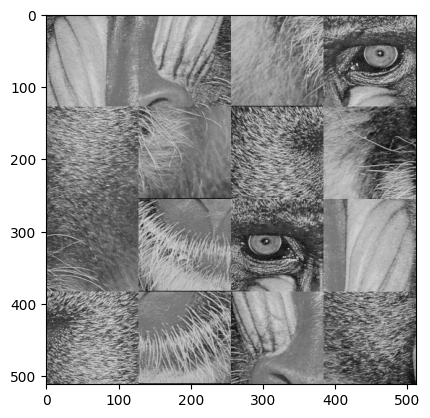

In [93]:
mosaic = []
for linha in range(4):
  for coluna in range(4):
    mosaic.append(baboon[128 * linha : (128 * (linha + 1)) , 128 * coluna : (128 * (coluna + 1)) ])

format = [[5,10,12,2],
          [7,15,0,8],
          [11,13,1,6],
          [3,14,9,4]]

mosaic_img = np.vstack([np.hstack([mosaic[i] for i in linha]) for linha in format])
plt.imshow(baboon)
plt.show()
plt.imshow(mosaic_img)
plt.show()

# 1.2 Combinação de imagens

Usaremos as imagens do `baboon` e da `butterfly`.

Para fazer as combinações, colocamos os pesos de cada imagem em uma lista e fazemos uma média ponderada dos níveis de cinza de cada imagem. Assim, dependendo do peso de cada imagem, conseguimos ver qual imagem prevalece.

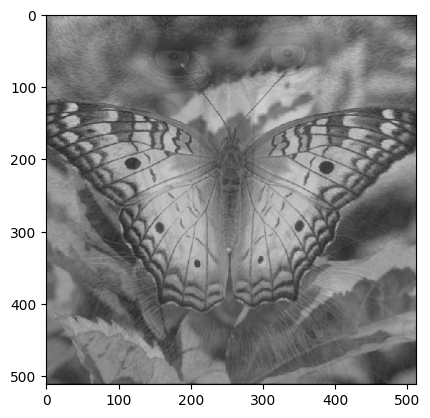

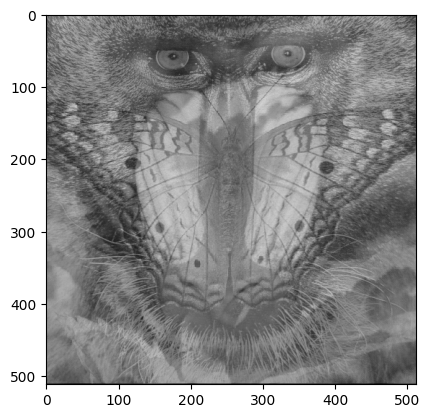

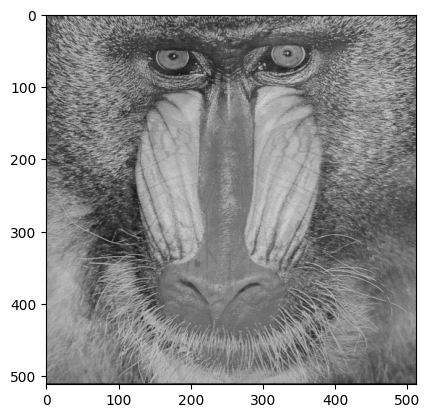

In [94]:
combination_weights = [(0.2,0.8), (0.5,0.5), (0.8,0.2)]
for weight in combination_weights:
  combination_img = np.uint8(baboon * weight[0] + butterfly * weight[1])
  plt.imshow(combination_img)
  plt.show()

# 1.3 Tranformação de intensidade

Usaremos a imagem `city`.

## 1.3a

Imagem original.

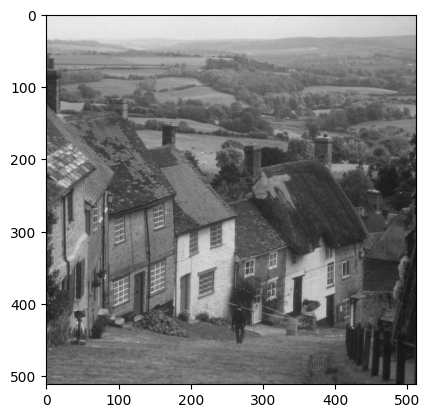

In [95]:
plt.imshow(city)

## 1.3b

Para obter o negativo, basta fazer `255 - pixel`.

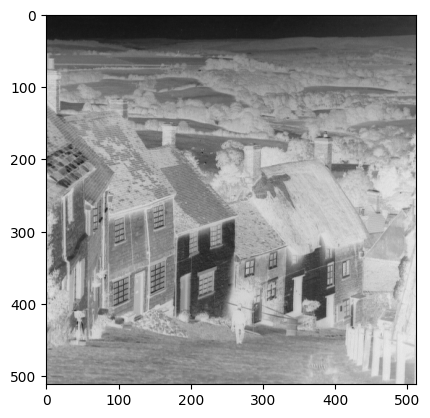

In [96]:
inverted_img = 255 - city
plt.imshow(inverted_img)

## 1.3c

Para converter o intervalo de [0, 255] para [100, 200], fazemos uma transformação linear simples.

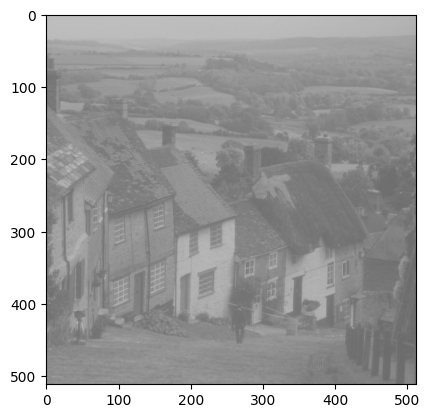

In [97]:
converted_img = np.uint8(city * 0.39 + 100)
plt.imshow(converted_img)

## 1.3d

Selecionamos as linhas pares e invertemos as colunas.

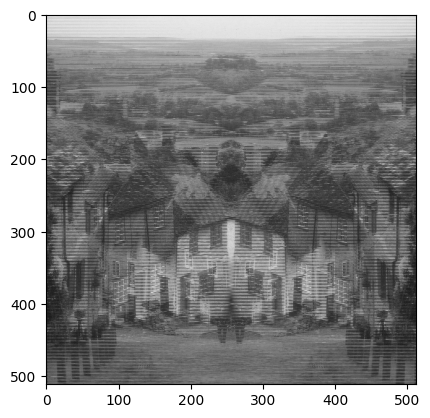

In [98]:
pair_img = city.copy()
pair_img[::2] = pair_img[::2, ::-1]
plt.imshow(pair_img)

## 1.3e

Selecionamos a metade inferior da imagem e copiamos a parte de cima invertida.

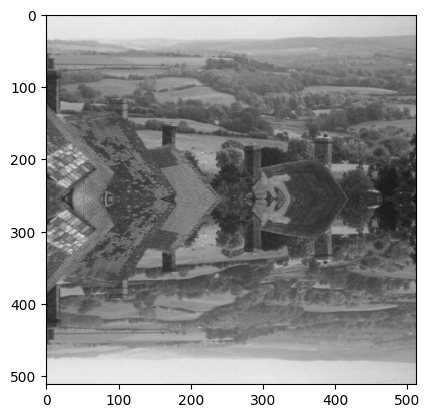

In [99]:
mirror_img = city.copy()
mirror_img[mirror_img.shape[0]//2:] = mirror_img[mirror_img.shape[0]//2-1::-1, :]
plt.imshow(mirror_img)

## 1.3f

Para espelhar, basta copiar inversamente as linhas.

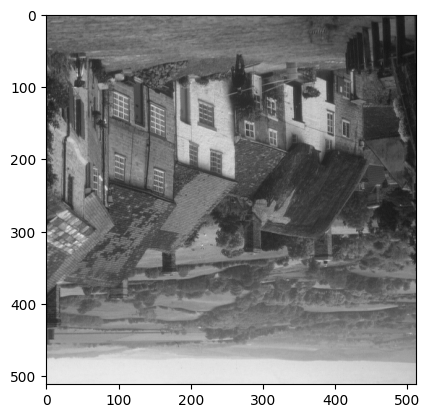

In [100]:
flip_img = city[::-1, :]
plt.imshow(flip_img)

# 1.4 Imagens coloridas

Iremos usar a imagem do `baboon_color`.

## 1.4a Sepia

Note que usamos weights.T para transpor a matriz de pesos, pois np.dot() calcula a multiplicação de matrizes entre a imagem e a matriz de pesos, e a matriz de pesos precisa ser transposta para que tenha a forma correta.

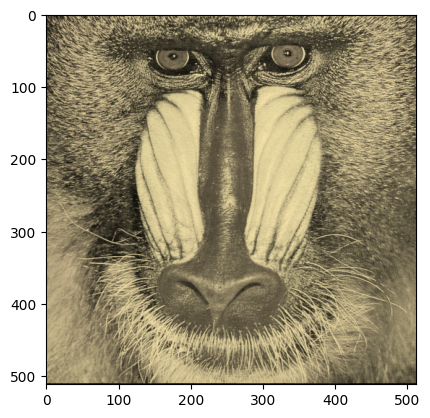

In [101]:
weights_a = np.array([[0.393, 0.769, 0.189],
                     [0.394, 0.686, 0.168],
                     [0.272, 0.534, 0.131]])
                     
img_a = baboon_color.dot(weights_a.T)
img_a /= img_a.max()

plt.imshow(img_a)

Após as transformações, podemos ver um filtro sepia na imagem.

## 1.4b Cinza

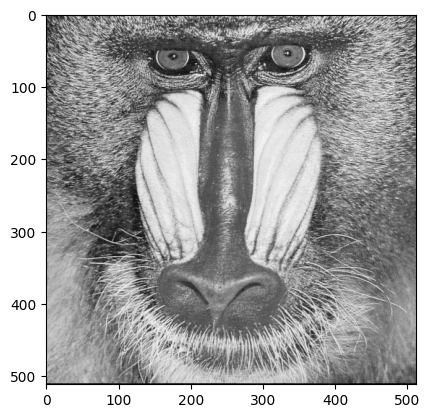

In [102]:
weights_b = np.array([0.2989, 0.5870, 0.1140])

img_b = np.dot(baboon_color[..., :3], weights_b)

plt.imshow(img_b, cmap="gray")

Após a transformção, vemos que a imagem foi para tons de cinza. É importante notar que precisamos indicar que a imagem resultante será monocromática. Se não indicarmos isso, a imagem sairá com uma cor totalmente diferente, como podemos ver a seguir.

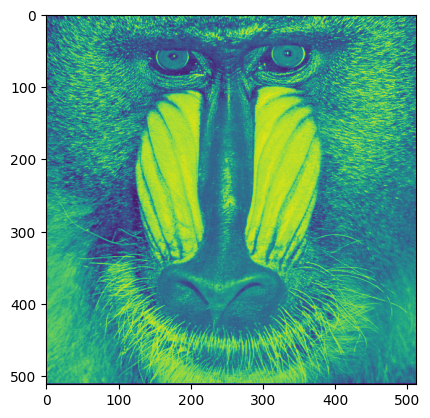

In [103]:
plt.imshow(img_b)

# 1.5 Ajuste de brilho

Iremos usar a imagem do `baboon`.

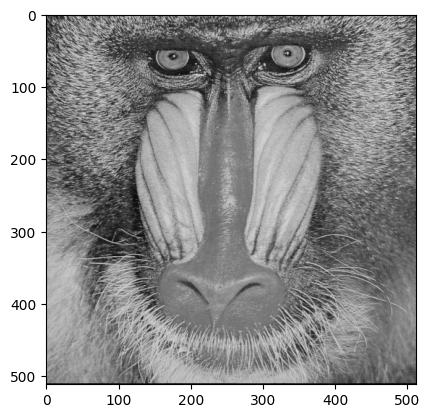

In [104]:
plt.imshow(baboon)

Primeiramente normalizamos a imagem para o intervalo de [0, 1], após isso usamos a equação `B = A^(1/γ)` e convertemos novamente para o intervalo [0, 255].

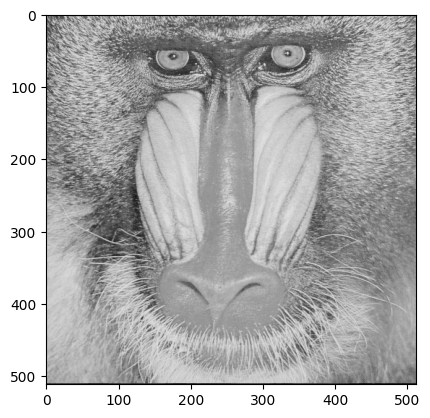

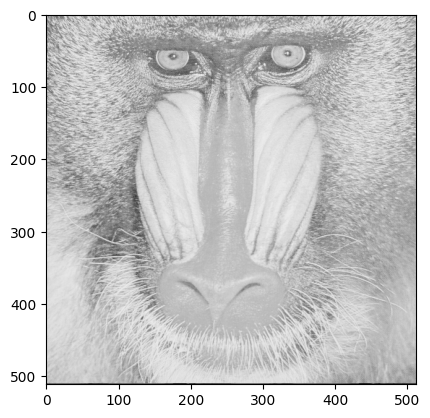

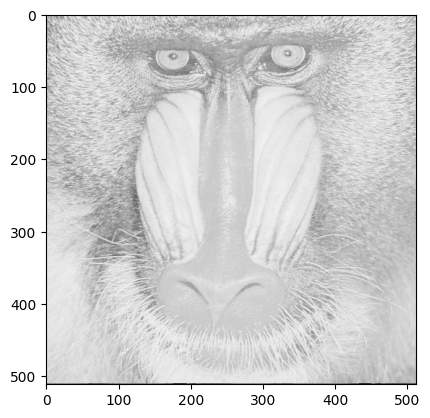

In [105]:
gamas = [1.5, 2.5, 3.5]
for gama in gamas:
  normalize_img = np.uint8(np.power(baboon / 255, 1/gama) * 255)
  plt.imshow(normalize_img)
  plt.show()

# 1.6 Quantização de Imagens

Iremos usar a imagem do `baboon`.

A quantidade de níveis representa a quantidade de cores limitada pelo número de bits associado a cada pixel. Ou seja, para 32 níveis, teríamos `255 / 32 = 8` tons de cinza.

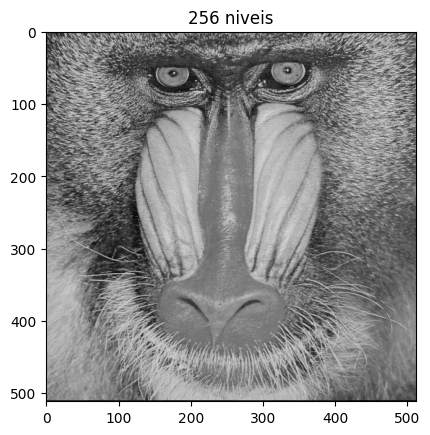

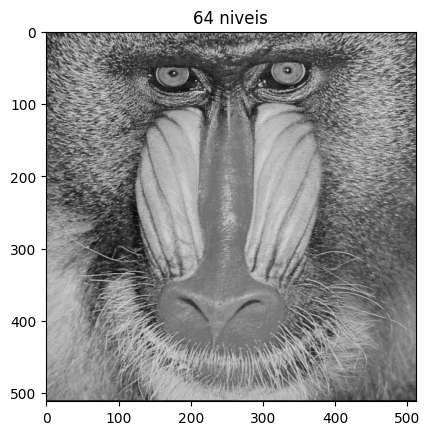

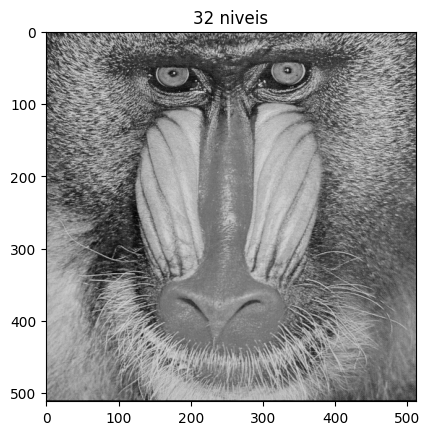

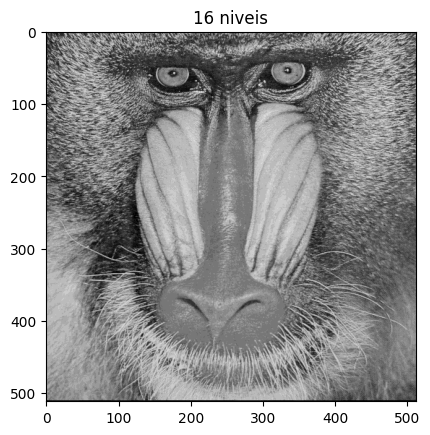

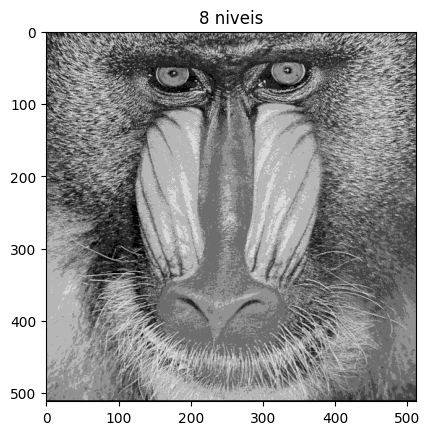

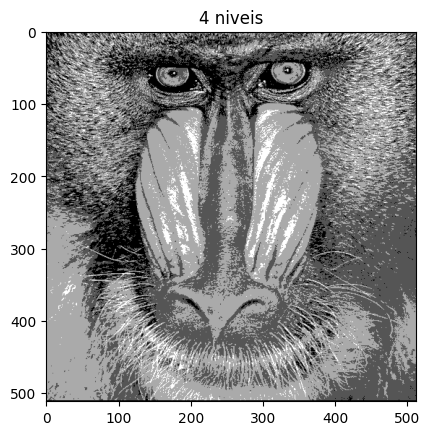

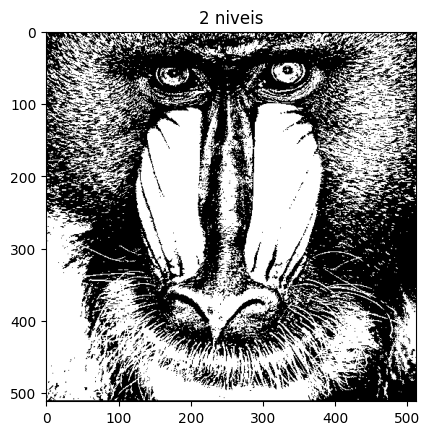

In [106]:
niveis = [256, 64, 32, 16, 8, 4, 2]
for nivel in niveis:
  r = 256 / nivel
  a = np.uint8(baboon / r)
  b = np.uint8((a / (nivel - 1)) * 255) # transforma de volta pra [0, 255] (para exibir a imagem)
  plt.imshow(b)
  plt.title(f'{nivel} niveis')
  plt.show()

# 1.7 Plano de Bits

Iremos usar a imagem do `baboon`.

Para extrairmos os planos de bits, usamos operações com bitwise para determinar se o bit será 0 ou 1. Dessa forma, os pixels da imagem serão 0 ou 2^n. 

In [107]:
def bit_plane(img, plane):
    mask = img >> plane & 1
    return np.where(mask, 255, 0)

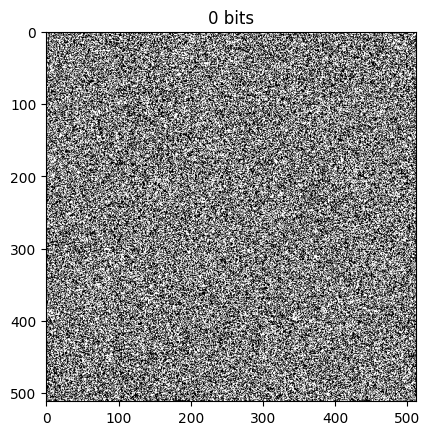

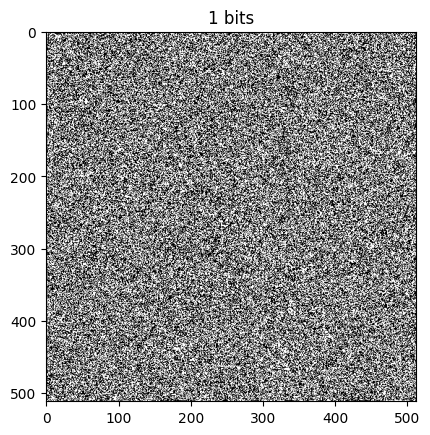

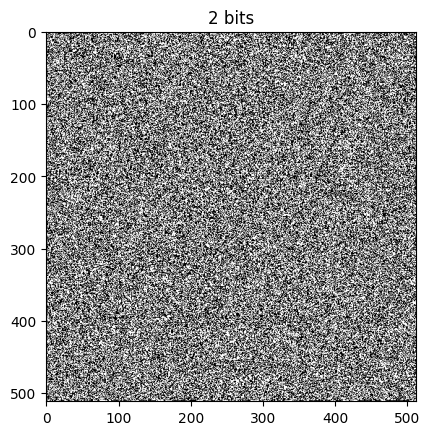

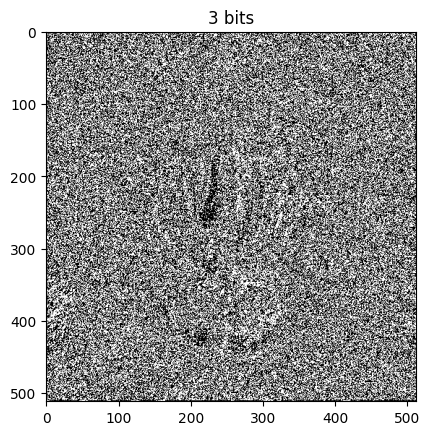

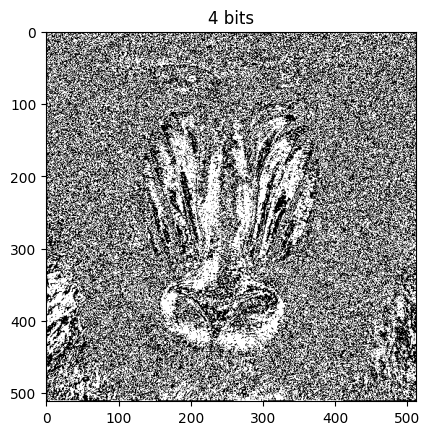

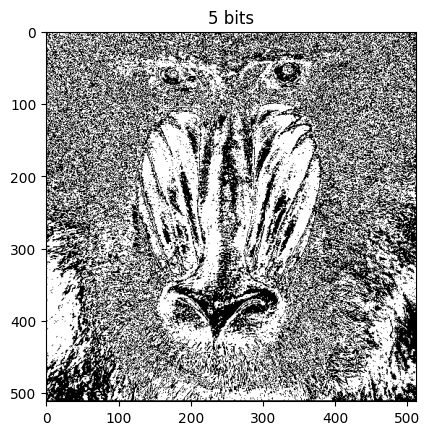

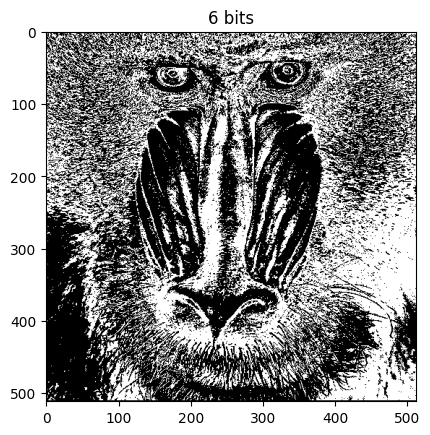

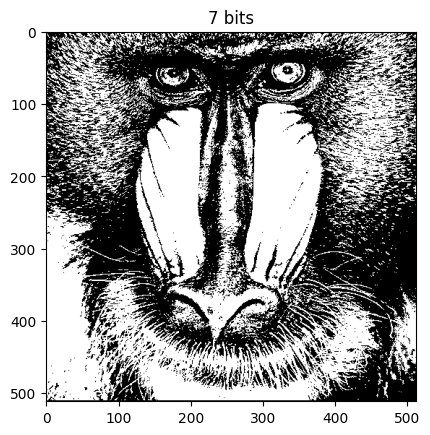

In [108]:
for bit in range(8):
    plt.imshow(bit_plane(baboon, bit))
    plt.title(f'{bit} bits')
    plt.show()

# 1.8 Filtragem de Imagem

Iremos usar a imagem da `city`.

In [109]:
def filter(image, kernel):
    return cv2.filter2D(image, -1, kernel)

## h1: Laplaciano de Gaussiana

Esse filtro faz um realce nas bordas.

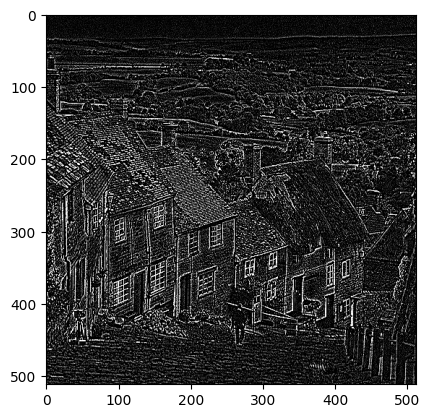

In [110]:
h1 = np.array([[0,0,-1,0,0],
              [0,-1,-2,-1,0],
              [-1,-2,16,-2,-1],
              [0,-1,-2,-1,0],
              [0,0,-1,0,0]])
imgH1 = filter(city, h1)
plt.imshow(imgH1)

## h11: Passa Alta

O filtro passa alta tende a realçar os detalhes da imagem, o que implica em realçar os componentes de alta frequência espacial.

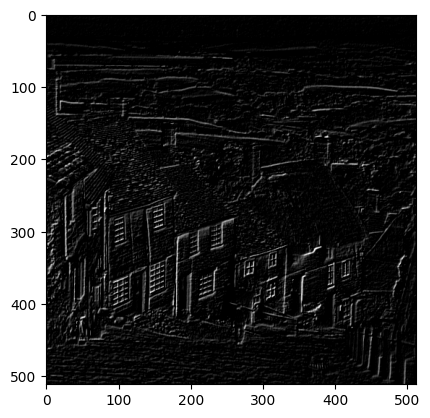

In [111]:
h11 = np.array([[-1,-1,0],
                [-1,0,1],
                [0,1,1]])
imgH11 = filter(city, h11)
plt.imshow(imgH11)

## h3 e h4: Filtro de Sobel

O filtro Sobel detecta bordas horizontais e verticais separadamente em uma imagem

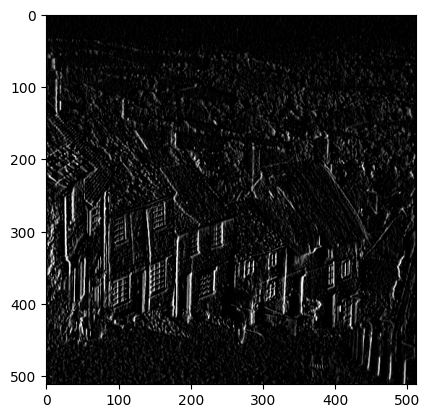

In [112]:
h3 = np.array([[-1,0,1],
               [-2,0,2],
               [-1,0,1]])
imgH3 = filter(city, h3)
plt.imshow(imgH3)

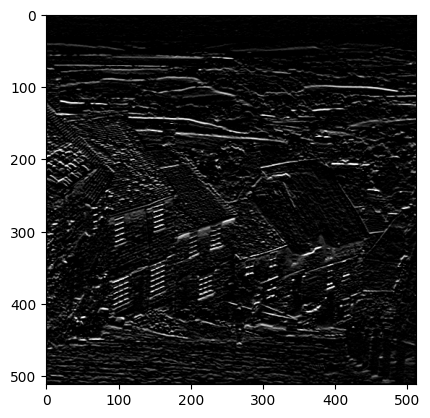

In [113]:
h4 = np.array([[-1,-2,-1],
               [0,0,0],
               [1,2,1]])
imgH4 = filter(city, h4)
plt.imshow(imgH4)

## Combinação de filtros

Fazendo a combinação dos filtros h3 e h4, temos uma imagem com realce nas bordas verticais e horizontais.

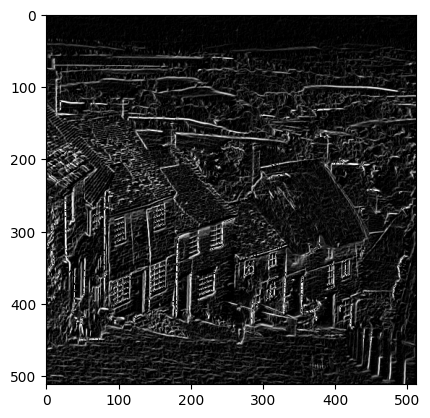

In [114]:
imgH12 = np.sqrt(np.power(np.float32(imgH3), 2) + np.power(np.float32(imgH4), 2))
plt.imshow(np.uint8(imgH12))

## Outros filtros

### h2: Gaussian Blur

Esse filtro aplica um efeito de blur na imagem

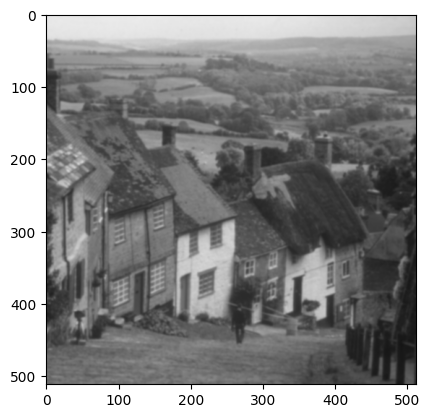

In [115]:
h2 = np.array([[1,4,6,4,1],
              [4,16,24,16,4],
              [6,24,36,24,6],
              [4,16,24,16,4],
              [1,4,6,4,1]]) * (1/256)
imgH2 = filter(city, h2)
plt.imshow(imgH2)

### h5: Realce de bordas

Mais um filtro de ralce de bordas

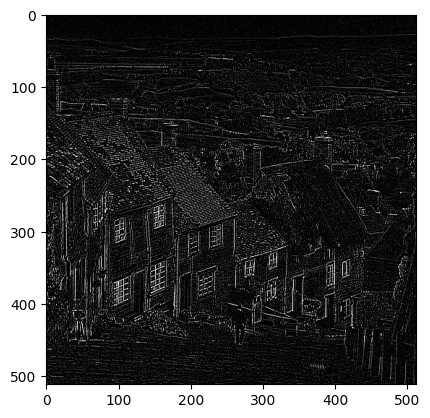

In [116]:
h5 = np.array([[-1,-1,-1],
               [-1,8,-1],
               [-1,-1,-1]])
imgH5 = filter(city, h5)
plt.imshow(imgH5)

### h6: Filtro de Caixa

Esse filtro teve um efeito de suavização de detalhes na imagem, pois calcula a média dos valores de intensidade de cinza dos pixels vizinhos.

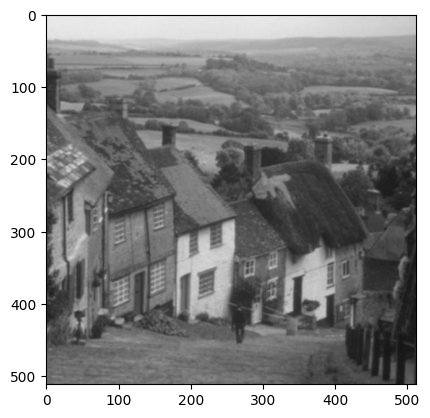

In [117]:
h6 = np.ones((3,3), float) * (1/9)
imgH6 = filter(city, h6)
plt.imshow(imgH6)

### h7: Filtro de Borda diagonal

Esse filtro aplica um filtro de borda no sentido da diagonal secundária da imagem.

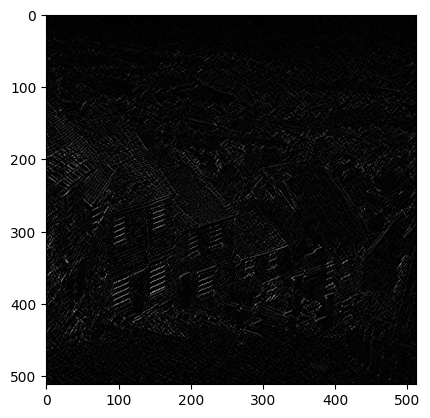

In [118]:
h7 = np.array([[-1,-1,2],
               [-1,2,-1],
               [2,-1,-1]])
imgH7 = filter(city, h7)
plt.imshow(imgH7)

### h8: Filtro de Borda diagonal

Esse filtro aplica um filtro de borda no sentido da diagonal principal de imagem.

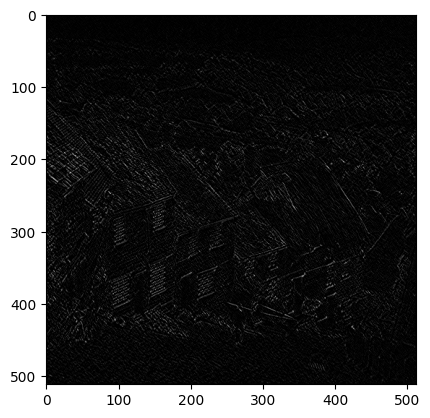

In [119]:
h8 = np.array([[2,-1,-1],
               [-1,2,-1],
               [-1,-1,2]])
imgH8 = filter(city, h8)
plt.imshow(imgH8)

### h9: Filtro Passa Baixa

Esse filtro aplica um efeito de blur mais uniforme na imagem.

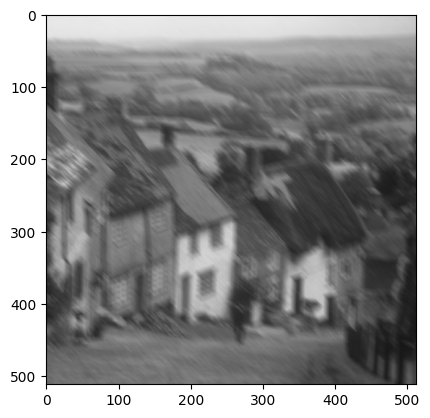

In [120]:
h9 = np.identity(9) * (1/9)
imgH9 = filter(city, h9)
plt.imshow(imgH9)

### h10: Filtro de foco

Esse filtro deixa a imagem com uma nitidez maior.

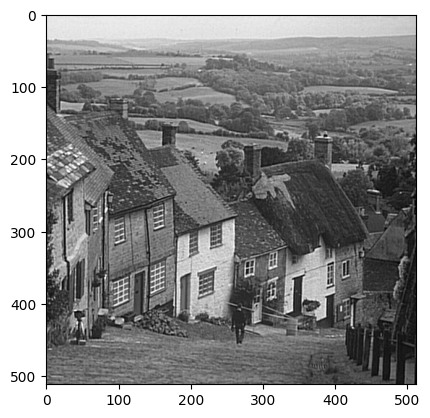

In [121]:
h10 = np.array([[-1,-1,-1,-1,-1],
                [-1,2,2,2,-1],
                [-1,2,8,2,-1],
                [-1,2,2,2,-1],
                [-1,-1,-1,-1,-1]]) * (1/8)
imgH10 = filter(city, h10)
plt.imshow(imgH10)